Connected to reveal_env (Python 3.10.12)

In [ ]:
import os
import sys
import numpy as np
import pandas as pd
import xarray as xr
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.colors as mcolors
from matplotlib.colors import Normalize
from matplotlib import cm
import gplately

sys.path.append(os.path.abspath(os.path.join(os.getcwd(), "..")))

from plato.optimisation import Optimisation
from plato.plate_torques import PlateTorques
from plato.plot import PlotReconstruction
from plato.slabs import Slabs
from plato.grids import Grids

# Plate reconstruction
reconstruction_name = "Muller2016" 

# Reconstruction ages of interest
ages = np.arange(0, 91, 1)

# Plates of interest
plateIDs = [501, 902, 903, 904, 909, 911, 918, 926]
plate_names = ["India", "Farallon", "Juan de Fuca", "Aluk", "Cocos", "Nazca", "Kula", "Izanagi"]

# Load excel file with settings
settings_file = os.path.join(os.getcwd(), "settings.xlsx")

# Set directory with sample data
data_dir = os.path.abspath(os.path.join(os.getcwd(), "..", "sample_data", "M2016"))

# Set directory with supplementary data
suppl_dir = os.path.abspath(os.path.join(os.getcwd(), "..", "..", "supplementary_data"))

# Load seafloor ages
seafloor_age_grids = {}; continental_grids = {}
for age in ages:
    seafloor_age_grids[age] = xr.open_dataset(os.path.join(data_dir, "seafloor_age_grids", f"M2016_SeafloorAgeGrid_{age}Ma.nc"))

# Plotting parameters
cm2in = 0.3937008
fig_width = 18*cm2in*2; fig_height_graphs = 8*cm2in*2; fig_height_maps = 10.5*cm2in*2
plt.rcParams["font.size"] = 12
plt.rcParams["font.family"] = "Arial"
title_fontsize = 18
plot_times = [45, 60, 75, 90]
projection = ccrs.Robinson(central_longitude = 160) 
annotations = ["a", "b", "c", "d"]

In [ ]:
# Set up PlateTorques objects
M2016 = PlateTorques(
    reconstruction_name = "Muller2016",
    ages = np.arange(0, 91, 1),
    cases_file = settings_file,
    cases_sheet = "4 - Slab pull optimisation",
    files_dir = os.path.abspath(os.path.join(os.getcwd(), "..", "..", "output_notebooks", "04b-Slab_pull_optimisation")),
    rotation_file = os.path.join(data_dir, "gplates_files", "M2016_rotations_Lr-Hb.rot"),
    topology_file = os.path.join(data_dir, "gplates_files", "M2016_topologies.gpml"),
    polygon_file = os.path.join(data_dir, "gplates_files",  "M2016_static_polygons.gpml"),
    seafloor_age_grids = seafloor_age_grids,
)

Calculating RMS velocities: 100%|██████████| 91/91 [00:00<00:00, 50360.43it/s]


NameError: name 'plot_M2016' is not defined

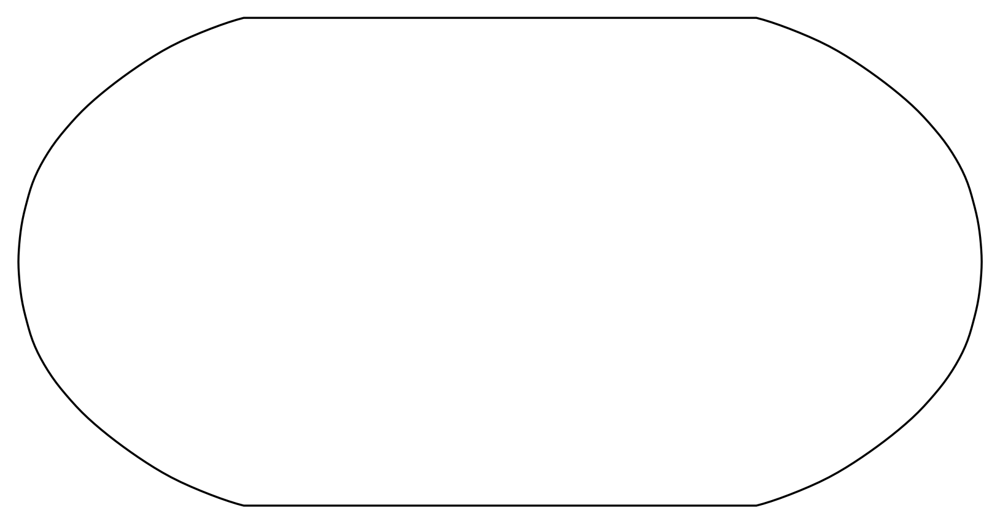

In [ ]:
for case in ["ref", "opt2"]:
    # Create a figure and gridspec
    fig = plt.figure(figsize=(fig_width, fig_height_maps), dpi=300)
    gs = gridspec.GridSpec(2, 2, wspace=0.1, hspace=0.1)

    plot_cases = ["opt1", "opt2", "opt1_nnr", "opt2_nnr"]

    plot_titles = ["Simple optimisation", "Complex optimisation", "Simple optimisation (NNR)", "Complex optimisation (NNR)"]

    # Plot slab pull constant along trenches for each case
    m = 0
    for i in range(2):
        for j in range(2):
            ax = plt.subplot(gs[i, j], projection=projection)
            plot_M2016.plot_basemap(ax)
            # ax.coastlines(lw=0.5)
            ax.set_title(f"Slab pull coefficient - {plot_ages[m]} Ma", fontsize=title_fontsize)
            ax.set_global()
            plot_M2016.plot_reconstruction(
                ax,
                plot_ages[m],
                coastlines_facecolour = "lightgrey",
                coastlines_edgecolour = "lightgrey",
                coastlines_linewidth = .1,
                plate_boundaries_linewidth = 1,
            )
            # for age in np.flip(M2016.ages):
            slab_data = M2016.slabs.data[plot_ages[m]]["opt2"]
            if plot_ages[m] < 36:
                slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [608, 901])]
            elif plot_ages[m] < 46:
                slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [901])]
            elif plot_ages[m] < 56:
                slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [501, 901])]
            else:
                slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [501])]

            sc = ax.scatter(
                    slab_data.lon,
                    slab_data.lat,
                    c = 100*(1-slab_data.slab_pull_constant),
                    s = 40,
                    vmin = 0,
                    vmax = 100,
                    cmap = "cmc.nuuk",
                    transform = ccrs.PlateCarree(),
                    # alpha=.5,
                )
                
                # ax.annotate(annotations[m], xy=(-0.053, 1.03), xycoords="axes fraction", fontweight="bold", fontsize=title_fontsize)
                
            m += 1

    # Create a new grid for the colorbar
    cax = fig.add_axes([0.362, 0.06, 0.3, 0.02])

    # Create a colorbar below the subplots
    cbar = plt.colorbar(sc, cax=cax, orientation="horizontal")

    # Set colourbar label
    cbar.set_label("Subduction resistance", labelpad=5)

    # Set colourbar ticks
    # cbar.set_ticks(np.arange(0, 1, 0.1))

In [ ]:
plot_M2016 = PlotReconstruction(M2016)

Checking whether the requested files need to be updated...
Requested files are up-to-date!
No continents in Muller2016.


Warning 1: /Users/thomas/Library/Caches/gplately/Muller2016.unzip/Muller_etal_2016_AREPS_Supplement_v1.17/Shapefiles/Coastlines/Global_coastlines_2015_v1_low_res.shp contains polygon(s) with rings with invalid winding order. Autocorrecting them, but that shapefile should be corrected using ogr2ogr for example.


NameError: name 'plot_ages' is not defined

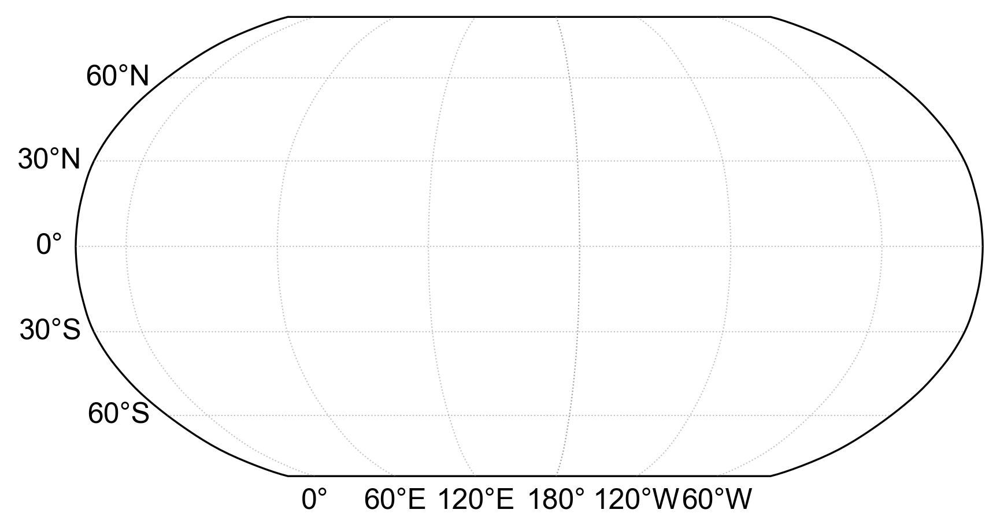

In [ ]:
for case in ["ref", "opt2"]:
    # Create a figure and gridspec
    fig = plt.figure(figsize=(fig_width, fig_height_maps), dpi=300)
    gs = gridspec.GridSpec(2, 2, wspace=0.1, hspace=0.1)

    plot_cases = ["opt1", "opt2", "opt1_nnr", "opt2_nnr"]

    plot_titles = ["Simple optimisation", "Complex optimisation", "Simple optimisation (NNR)", "Complex optimisation (NNR)"]

    # Plot slab pull constant along trenches for each case
    m = 0
    for i in range(2):
        for j in range(2):
            ax = plt.subplot(gs[i, j], projection=projection)
            plot_M2016.plot_basemap(ax)
            # ax.coastlines(lw=0.5)
            ax.set_title(f"Slab pull coefficient - {plot_ages[m]} Ma", fontsize=title_fontsize)
            ax.set_global()
            plot_M2016.plot_reconstruction(
                ax,
                plot_ages[m],
                coastlines_facecolour = "lightgrey",
                coastlines_edgecolour = "lightgrey",
                coastlines_linewidth = .1,
                plate_boundaries_linewidth = 1,
            )
            # for age in np.flip(M2016.ages):
            slab_data = M2016.slabs.data[plot_ages[m]][case]
            if plot_ages[m] < 36:
                slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [608, 901])]
            elif plot_ages[m] < 46:
                slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [901])]
            elif plot_ages[m] < 56:
                slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [501, 901])]
            else:
                slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [501])]

            sc = ax.scatter(
                    slab_data.lon,
                    slab_data.lat,
                    c = 100*(1-slab_data.slab_pull_constant),
                    s = 40,
                    vmin = 0,
                    vmax = 100,
                    cmap = "cmc.nuuk",
                    transform = ccrs.PlateCarree(),
                    # alpha=.5,
                )
                
                # ax.annotate(annotations[m], xy=(-0.053, 1.03), xycoords="axes fraction", fontweight="bold", fontsize=title_fontsize)
                
            m += 1

    # Create a new grid for the colorbar
    cax = fig.add_axes([0.362, 0.06, 0.3, 0.02])

    # Create a colorbar below the subplots
    cbar = plt.colorbar(sc, cax=cax, orientation="horizontal")

    # Set colourbar label
    cbar.set_label("Subduction resistance", labelpad=5)

    # Set colourbar ticks
    # cbar.set_ticks(np.arange(0, 1, 0.1))

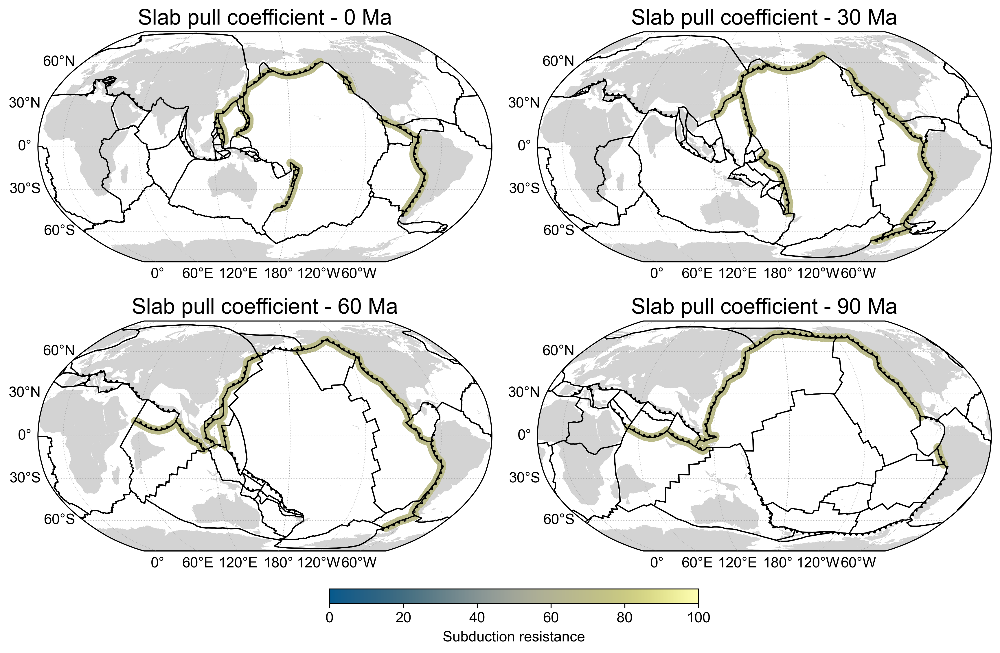

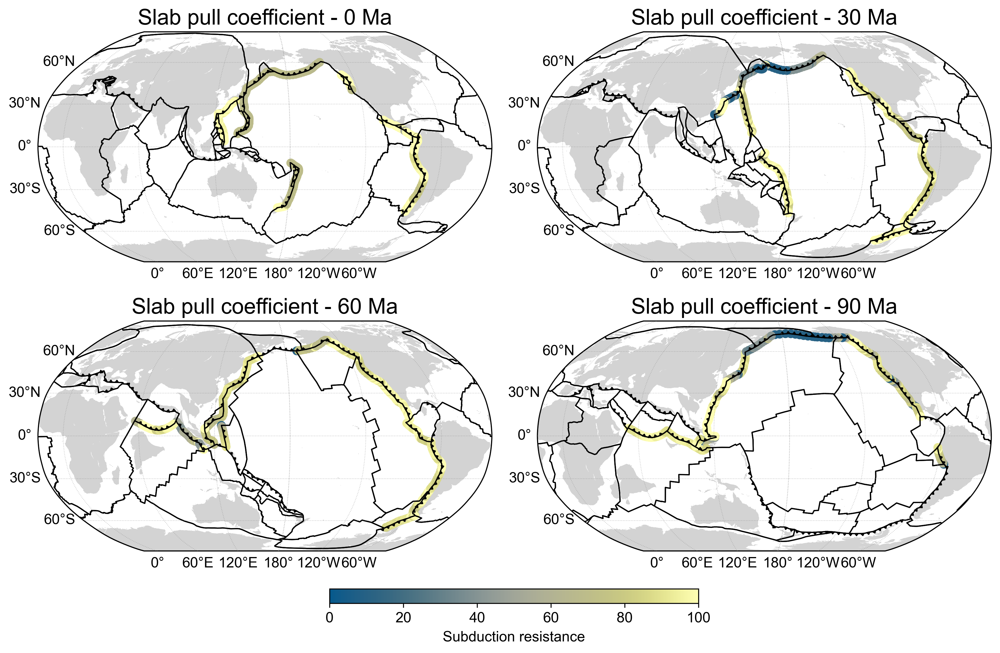

In [ ]:
for case in ["ref", "opt2"]:
    # Create a figure and gridspec
    fig = plt.figure(figsize=(fig_width, fig_height_maps), dpi=300)
    gs = gridspec.GridSpec(2, 2, wspace=0.1, hspace=0.1)

    plot_ages = [0, 30, 60, 90]

    # Plot slab pull constant along trenches for each case
    m = 0
    for i in range(2):
        for j in range(2):
            ax = plt.subplot(gs[i, j], projection=projection)
            plot_M2016.plot_basemap(ax)
            # ax.coastlines(lw=0.5)
            ax.set_title(f"Slab pull coefficient - {plot_ages[m]} Ma", fontsize=title_fontsize)
            ax.set_global()
            plot_M2016.plot_reconstruction(
                ax,
                plot_ages[m],
                coastlines_facecolour = "lightgrey",
                coastlines_edgecolour = "lightgrey",
                coastlines_linewidth = .1,
                plate_boundaries_linewidth = 1,
            )
            # for age in np.flip(M2016.ages):
            slab_data = M2016.slabs.data[plot_ages[m]][case]
            if plot_ages[m] < 36:
                slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [608, 901])]
            elif plot_ages[m] < 46:
                slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [901])]
            elif plot_ages[m] < 56:
                slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [501, 901])]
            else:
                slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [501])]

            sc = ax.scatter(
                    slab_data.lon,
                    slab_data.lat,
                    c = 100*(1-slab_data.slab_pull_constant),
                    s = 40,
                    vmin = 0,
                    vmax = 100,
                    cmap = "cmc.nuuk",
                    transform = ccrs.PlateCarree(),
                    # alpha=.5,
                )
                
                # ax.annotate(annotations[m], xy=(-0.053, 1.03), xycoords="axes fraction", fontweight="bold", fontsize=title_fontsize)
                
            m += 1

    # Create a new grid for the colorbar
    cax = fig.add_axes([0.362, 0.06, 0.3, 0.02])

    # Create a colorbar below the subplots
    cbar = plt.colorbar(sc, cax=cax, orientation="horizontal")

    # Set colourbar label
    cbar.set_label("Subduction resistance", labelpad=5)

    # Set colourbar ticks
    # cbar.set_ticks(np.arange(0, 1, 0.1))

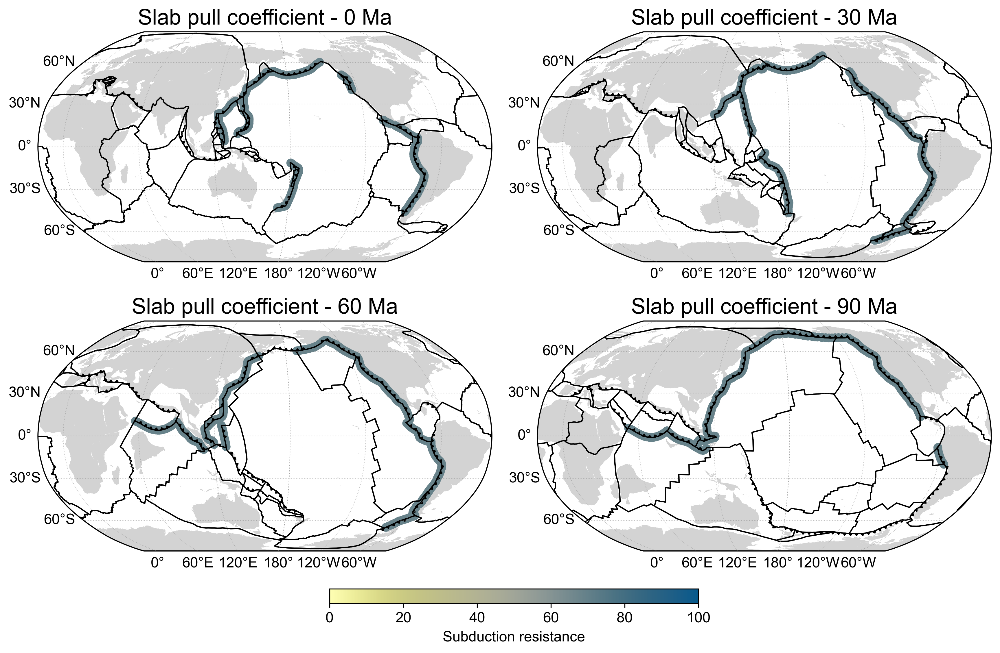

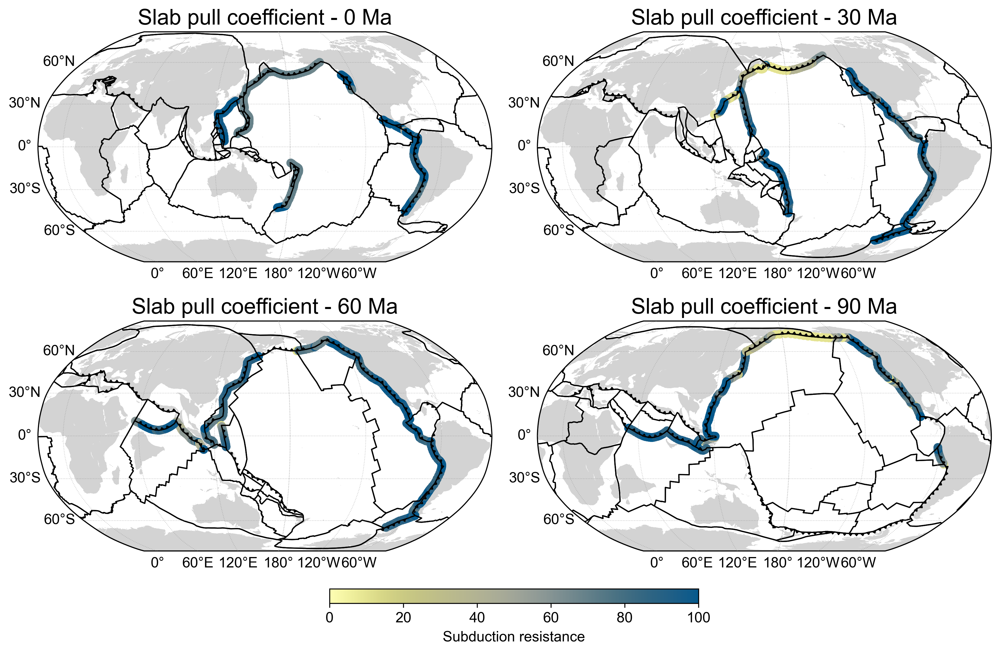

In [ ]:
for case in ["ref", "opt2"]:
    # Create a figure and gridspec
    fig = plt.figure(figsize=(fig_width, fig_height_maps), dpi=300)
    gs = gridspec.GridSpec(2, 2, wspace=0.1, hspace=0.1)

    plot_ages = [0, 30, 60, 90]

    # Plot slab pull constant along trenches for each case
    m = 0
    for i in range(2):
        for j in range(2):
            ax = plt.subplot(gs[i, j], projection=projection)
            plot_M2016.plot_basemap(ax)
            # ax.coastlines(lw=0.5)
            ax.set_title(f"Slab pull coefficient - {plot_ages[m]} Ma", fontsize=title_fontsize)
            ax.set_global()
            plot_M2016.plot_reconstruction(
                ax,
                plot_ages[m],
                coastlines_facecolour = "lightgrey",
                coastlines_edgecolour = "lightgrey",
                coastlines_linewidth = .1,
                plate_boundaries_linewidth = 1,
            )
            # for age in np.flip(M2016.ages):
            slab_data = M2016.slabs.data[plot_ages[m]][case]
            if plot_ages[m] < 36:
                slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [608, 901])]
            elif plot_ages[m] < 46:
                slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [901])]
            elif plot_ages[m] < 56:
                slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [501, 901])]
            else:
                slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [501])]

            sc = ax.scatter(
                    slab_data.lon,
                    slab_data.lat,
                    c = 100*(1-slab_data.slab_pull_constant),
                    s = 40,
                    vmin = 0,
                    vmax = 100,
                    cmap = "cmc.nuuk_r",
                    transform = ccrs.PlateCarree(),
                    # alpha=.5,
                )
                
                # ax.annotate(annotations[m], xy=(-0.053, 1.03), xycoords="axes fraction", fontweight="bold", fontsize=title_fontsize)
                
            m += 1

    # Create a new grid for the colorbar
    cax = fig.add_axes([0.362, 0.06, 0.3, 0.02])

    # Create a colorbar below the subplots
    cbar = plt.colorbar(sc, cax=cax, orientation="horizontal")

    # Set colourbar label
    cbar.set_label("Subduction resistance", labelpad=5)

    # Set colourbar ticks
    # cbar.set_ticks(np.arange(0, 1, 0.1))

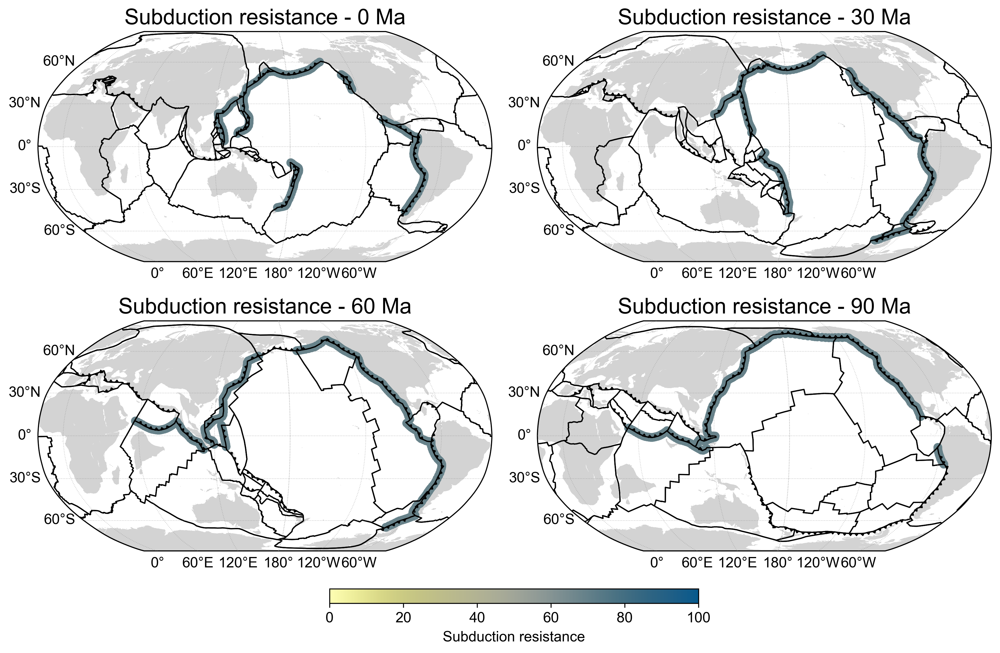

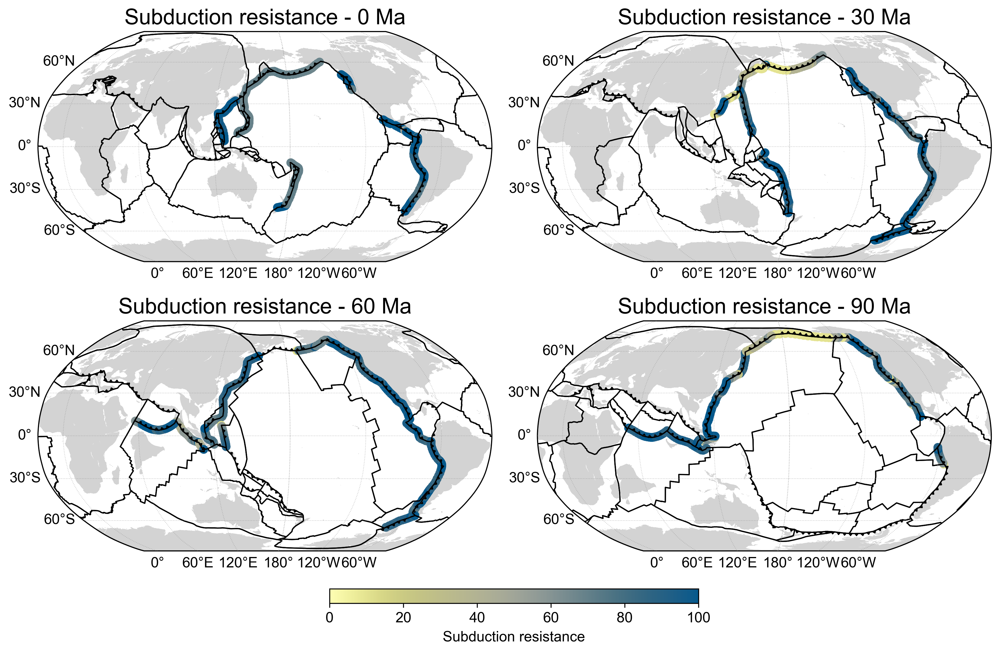

In [ ]:
for case in ["ref", "opt2"]:
    # Create a figure and gridspec
    fig = plt.figure(figsize=(fig_width, fig_height_maps), dpi=300)
    gs = gridspec.GridSpec(2, 2, wspace=0.1, hspace=0.1)

    plot_ages = [0, 30, 60, 90]

    # Plot slab pull constant along trenches for each case
    m = 0
    for i in range(2):
        for j in range(2):
            ax = plt.subplot(gs[i, j], projection=projection)
            plot_M2016.plot_basemap(ax)
            # ax.coastlines(lw=0.5)
            ax.set_title(f"Subduction resistance - {plot_ages[m]} Ma", fontsize=title_fontsize)
            ax.set_global()
            plot_M2016.plot_reconstruction(
                ax,
                plot_ages[m],
                coastlines_facecolour = "lightgrey",
                coastlines_edgecolour = "lightgrey",
                coastlines_linewidth = .1,
                plate_boundaries_linewidth = 1,
            )
            # for age in np.flip(M2016.ages):
            slab_data = M2016.slabs.data[plot_ages[m]][case]
            if plot_ages[m] < 36:
                slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [608, 901])]
            elif plot_ages[m] < 46:
                slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [901])]
            elif plot_ages[m] < 56:
                slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [501, 901])]
            else:
                slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [501])]

            sc = ax.scatter(
                    slab_data.lon,
                    slab_data.lat,
                    c = 100*(1-slab_data.slab_pull_constant),
                    s = 40,
                    vmin = 0,
                    vmax = 100,
                    cmap = "cmc.nuuk_r",
                    transform = ccrs.PlateCarree(),
                    # alpha=.5,
                )
                
                # ax.annotate(annotations[m], xy=(-0.053, 1.03), xycoords="axes fraction", fontweight="bold", fontsize=title_fontsize)
                
            m += 1

    # Create a new grid for the colorbar
    cax = fig.add_axes([0.362, 0.06, 0.3, 0.02])

    # Create a colorbar below the subplots
    cbar = plt.colorbar(sc, cax=cax, orientation="horizontal")

    # Set colourbar label
    cbar.set_label("Subduction resistance", labelpad=5)

    # Set colourbar ticks
    # cbar.set_ticks(np.arange(0, 1, 0.1))

NameError: name 'globsed' is not defined

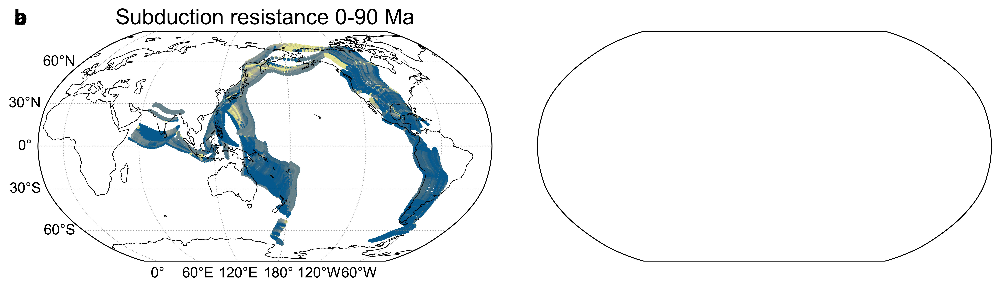

In [ ]:
for m in range(3):
    # Create a figure and gridspec
    fig = plt.figure(figsize=(fig_width, fig_height_maps*.55), dpi=600)
    gs = gridspec.GridSpec(1, 2, wspace=0.1)

    for k in range(2):
        # Plot slab pull constant along trenches for each case
        ax = plt.subplot(gs[0], projection=projection)
        plot_M2016.plot_basemap(ax)
        ax.annotate("ab"[k], xy=(-0.053, 1.03), xycoords="axes fraction", fontweight="bold", fontsize=title_fontsize)
        
        if k == 0:
            ax.set_title(f"Subduction resistance 0-90 Ma", fontsize=title_fontsize)
            for age in np.flip(M2016.ages):
                slab_data = M2016.slabs.data[age]["opt2"]
                if age < 36:
                    slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [608, 901])]
                elif age < 46:
                    slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [901])]
                elif age < 56:
                    slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [501, 901])]
                else:
                    slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [501])]

                sc = ax.scatter(
                        slab_data.lon,
                        slab_data.lat,
                        c = 100*(1-slab_data.slab_pull_constant),
                        s = 2,
                        vmin = 0,
                        vmax = 100,
                        cmap = "cmc.nuuk_r",
                        transform = ccrs.PlateCarree(),
                        # alpha=.5,
                    )
        if k == 1:      
            ax = plt.subplot(gs[1], projection=projection)
            if m == 0:
                ax.imshow(np.ones_like(globsed.z), extent=[-180, 180, 90, -90], transform=ccrs.PlateCarree(), cmap="cmc.grayC", vmin=0, vmax=1)
                for k, age in enumerate(np.flip(reconstruction_ages)):
                    gplot.update_time(age)
                    trenches = gplot.plot_trenches(ax, lw=1, color=colours[k])
                ax.set_title(f"Reconstructed subduction zones 0-200 Ma", fontsize=title_fontsize)

            if m == 1:
                h = ax.hist2d(
                    lons, lats, bins=[72, 36], cmap="cmc.devon_r",
                    weights=fluxes, transform=ccrs.PlateCarree(), norm=mcolors.LogNorm(vmin=1e16, vmax=1e18)
                )
                ax.set_title(f"Cumulative slab flux 0-200 Ma", fontsize=title_fontsize)

            if m == 2:
                thicknesses = plot_M2016.plot_sediment_map(ax, 0, "ref", vmin=1e1)
                ax.set_title(f"Marine sediment distribution", fontsize=title_fontsize)

        ax.set_global()
        ax.coastlines(lw=0.5)

    # Create a ScalarMappable for the colourbar
    norm = Normalize(vmin=reconstruction_ages[0], vmax=reconstruction_ages[-1])
    sm = cm.ScalarMappable(cmap="cmc.lajolla_r", norm=norm)
    sm.set_array([])

    # Create a new grid for the colorbar
    cax1 = fig.add_axes([0.212, 0.06/.55, 0.2, 0.02/.55])
    cax2 = fig.add_axes([0.617, 0.06/.55, 0.2, 0.02/.55])

    # Create a colorbar below the subplots
    cbar1 = plt.colorbar(sc, cax=cax1, orientation="horizontal")
    if m == 0:
        cbar2 = plt.colorbar(sm, cax=cax2, orientation="horizontal")
    if m == 1:
        cbar2 = plt.colorbar(h[3], cax=cax2, orientation="vertical", extend="both", extendfrac=7.5e-2)
    if m == 2:
        cbar2 = plt.colorbar(thicknesses[0], cax=cax2, orientation="vertical", extend="both", extendfrac=7.5e-2)

    # Set colourbar label
    cbar1.set_label("Subduction resistance", labelpad=5)
    if m == 0:
        cbar2.set_label("Reconstruction age [Ma]", labelpad=5)
    if m == 1:
        cbar2.set_label("Log10(Slab flux [m$^3$])", labelpad=1.5)
        cbar2.set_ticklabels([16, 17, 18, 19])
        cbar2.set_ticks([1e16, 1e17, 1e18])
    if m == 2:
        cbar2.set_label("Log10(Sediment thickness [m])", labelpad=5)

    # Set colourbar ticks
    cbar1.set_ticks(np.arange(0, 1, 0.1))

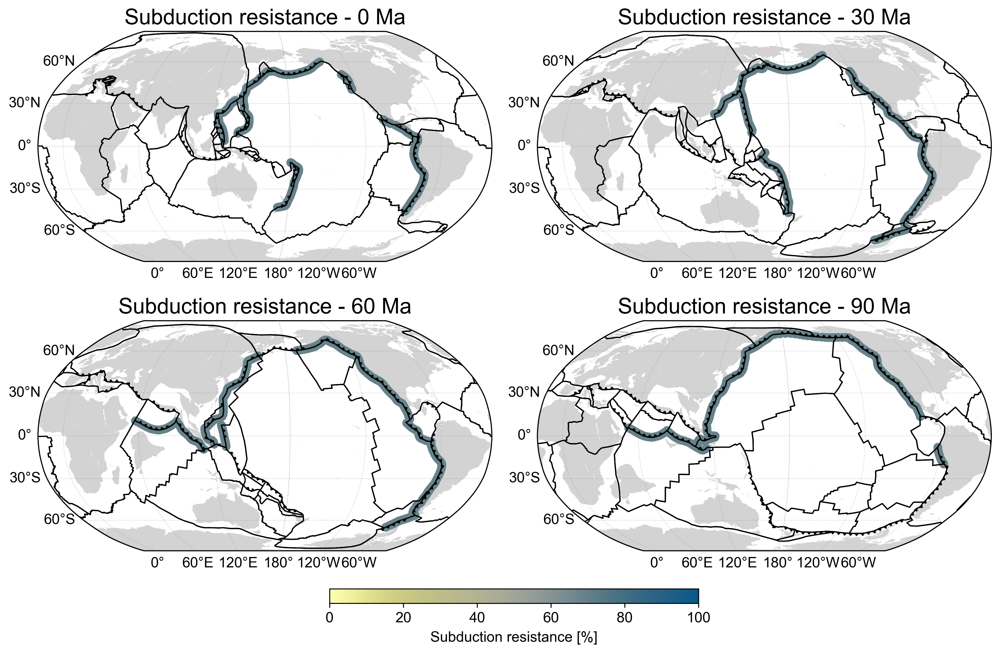

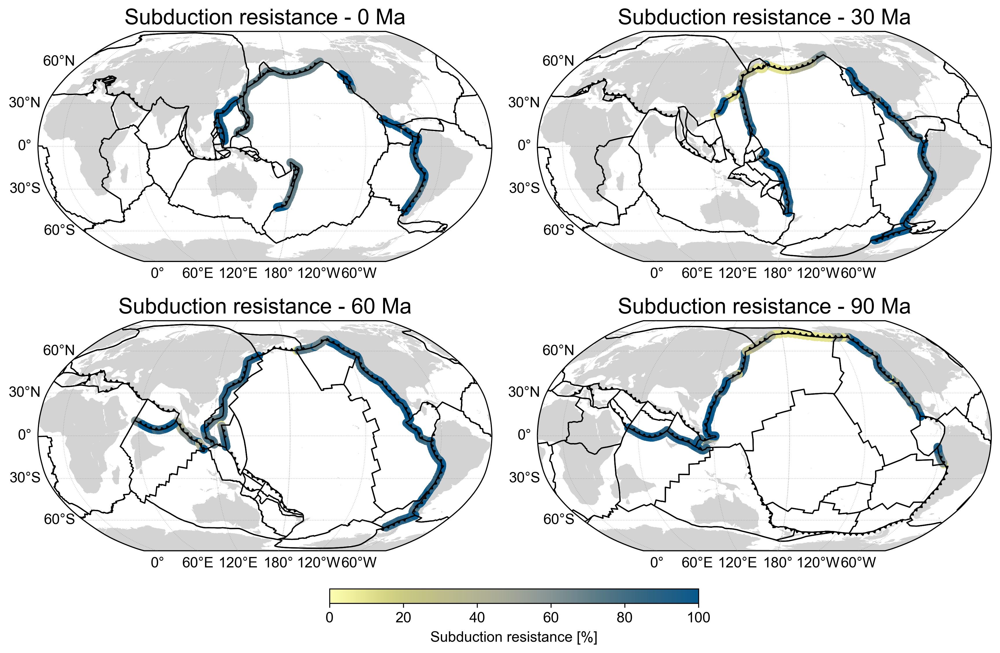

In [ ]:
for case in ["ref", "opt2"]:
    # Create a figure and gridspec
    fig = plt.figure(figsize=(fig_width, fig_height_maps), dpi=300)
    gs = gridspec.GridSpec(2, 2, wspace=0.1, hspace=0.1)

    plot_ages = [0, 30, 60, 90]

    # Plot slab pull constant along trenches for each case
    m = 0
    for i in range(2):
        for j in range(2):
            ax = plt.subplot(gs[i, j], projection=projection)
            plot_M2016.plot_basemap(ax)
            # ax.coastlines(lw=0.5)
            ax.set_title(f"Subduction resistance - {plot_ages[m]} Ma", fontsize=title_fontsize)
            ax.set_global()
            plot_M2016.plot_reconstruction(
                ax,
                plot_ages[m],
                coastlines_facecolour = "lightgrey",
                coastlines_edgecolour = "lightgrey",
                coastlines_linewidth = .1,
                plate_boundaries_linewidth = 1,
            )
            # for age in np.flip(M2016.ages):
            slab_data = M2016.slabs.data[plot_ages[m]][case]
            if plot_ages[m] < 36:
                slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [608, 901])]
            elif plot_ages[m] < 46:
                slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [901])]
            elif plot_ages[m] < 56:
                slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [501, 901])]
            else:
                slab_data = slab_data[slab_data.lower_plateID.isin(plateIDs + [501])]

            sc = ax.scatter(
                    slab_data.lon,
                    slab_data.lat,
                    c = 100*(1-slab_data.slab_pull_constant),
                    s = 40,
                    vmin = 0,
                    vmax = 100,
                    cmap = "cmc.nuuk_r",
                    transform = ccrs.PlateCarree(),
                    # alpha=.5,
                )
                
                # ax.annotate(annotations[m], xy=(-0.053, 1.03), xycoords="axes fraction", fontweight="bold", fontsize=title_fontsize)
                
            m += 1

    # Create a new grid for the colorbar
    cax = fig.add_axes([0.362, 0.06, 0.3, 0.02])

    # Create a colorbar below the subplots
    cbar = plt.colorbar(sc, cax=cax, orientation="horizontal")

    # Set colourbar label
    cbar.set_label("Subduction resistance [%]", labelpad=5)

    # Set colourbar ticks
    # cbar.set_ticks(np.arange(0, 1, 0.1))